In [2]:
import numpy as np
from scipy import signal as signal
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode,iplot
from scipy.io import wavfile
import scipy.io
import plotly.express as px
from simple_vad import VoiceActivityDetection
import pyroomacoustics as pra
import matplotlib.pyplot as plt
from plotly.tools import mpl_to_plotly
init_notebook_mode()
fs, audio = wavfile.read("/home/tfpeng/1234.wav")
fig=go.Figure()
fig.add_traces([go.Scatter( y=audio, mode='lines', name='lines')])
fig.show()

# 麦克风阵列
## 1. 麦克风阵列的模型
![麦克风阵列基本模型](./micphone_array_modle.png)

上面图示的模型为基本模型，假设信号源处于远场，信号到达阵列基本是平面波，信号传播方向与阵列夹角为$\theta$
根据模型可知，信号到达每一个麦克风的时间是不一样的，时间差$\tau$表现在阵列的接收信号里为相位差$\phi$，从模型可以计算出每个
传感器之间的时间差为<p> $\tau=\frac{d*cos(\theta)}{c}$</p>于是相位差为<p> $\phi=2*\pi*f*\tau$</p>假设第一个麦克风接收到的信号为$s(t)$噪声为$n_1(t)$
则:<p> 第1个麦克风$M_1$的接收信号为$y_1(t)=s(t)+n_1(t)$</p> <p> 第2个麦克风$M_2$的接收信号为$y_1(t)=s(t)*e^{-j\phi}+n_2(t)$</p><p> 第3个麦克风$M_3$的接收信号为$y_1(t)=s(t)*e^{-2j\phi}+n_3(t)$</p> <p> 第4个麦克风$M_4$的接收信号为$y_1(t)=s(t)*e^{-3j\phi}+n_4(t)$</p>

如果我们想要得到最强的信号，只需要将各个阵元接收的信号做相应的延时然后在累加起来就能得到最基本的波束成形，这种波束成形称为Delay-Sum beamforming(DS)

那如何得到信号延时的时间呢？从上面模型可知，延时时间$\tau$会与阵列结构和信号源位置有关，阵列结构一旦确定就不在变换，在我们计算时是已知的，那信号源位置如何得到？

这就需要进行DOA(Direction of Arrival)的计算

下面我们将使用pyroomacoustics工具包进行仿真然后计算DOA和波束成形


(0.0, 9.0)

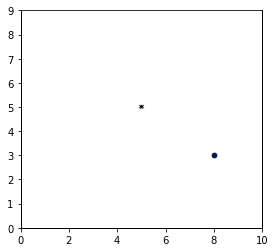

In [3]:
# 模拟房间
room_dim = [10, 10]  # meters
rt60_tgt = 0.2  # seconds
# e_absorption, max_order = pra.inverse_sabine(rt60_tgt, room_dim)
room = pra.ShoeBox(
    room_dim, fs=fs
)
# 放置信号源，信号源为上面加载的单声道音频
room.add_source([8, 3], signal=audio, delay=0.5)
# 麦克风阵列结构，根据实际机器人上的阵列结构进行定义
mic_locs = np.c_[
    [5, 5], [5.037, 5.0215],[4.963, 5.0215],[5, 5.043]
]
#将麦克风阵列添加到房间中
room.add_microphone_array(mic_locs)
# 开始仿真
room.simulate()
#将麦克风阵列接收到的信号保存
room.mic_array.to_wav(
    f"./1234.wav",
    norm=True,
    bitdepth=np.int16,
)
# 绘制房间
fig, ax = room.plot()
ax.set_xlim([0, 10])
ax.set_ylim([0, 9])

## 2.DOA估计
DOA估计一般有三种方法，

第一个通过接收信号计算麦克风之间的延时，然后通过上面的原理推算出角度$\theta$这种方法称为TDOA

第二个通过可控波束形成在整个空间内扫描，当输出信号功率最大时，就认为是信号源的位置，我们可以推算出角度

第三个通过空间频谱搜索

### 1，TDOA估计

TDOA估计算法优点是简单直观，实时性好，缺点是容易受到噪声混响的干扰并且分辨率不高

TDOA最简单的计算方法是对两个信号进行互相关运算，求出两个信号的延时点数，但是在实际应用中，直接进行互相关运算会受到噪声影响导致计算的延时出现误差，从上面的阵列信号模型可知，
阵列接收到信号的相位反应了信号间的延时，如果能只保留相位去除幅值的影响就可以去掉很大一部分的噪声或干扰影响，同时我们知道，时域相关运算与功率谱是一对傅里叶变换，因此如果我们对
功率谱进行加权然后IFFT到时域就得到了改进的互相关函数，这种处理方法叫做广义互相关（GCC）

$R_{x_i,x_j}(\tau)=\int_{-\infty}^{+\infty} w*G_{x_i,x_j}*e^{jw\tau}dw$

$w$为权重，$G_{x_i,x_j}$为功率谱

其中常用的一种加权方法是白化功率谱即$w=\frac{1}{|G_{x_i,x_j}|}$

这种方式称为GCC-PHAT

步骤为：

- 计算互功率谱
- 加权互功率谱
- IFFT到时域
- 搜索最大值
- 计算最大值对应的延时

以下为GCC-PHAT Python实现

In [40]:
def GccPhat(x1, x2,fs, fftlen=None):
    N=len(x1)+len(x2)-1
    times=32
    x1_fft = np.fft.fft(x1,fftlen)
    x2_fft = np.fft.fft(x2,fftlen)
    G = x1_fft*np.conj(x2_fft)
    Gw = G/(abs(G))
    RR = np.fft.ifft(Gw,times*N)
    # 零频平移
    RR_shift = np.fft.ifftshift(RR)
    index = np.argmax(abs(RR_shift))
    # 计算时延（N为采样点，fs为采样频率）
    delay=(index-times*N/2)/(times*fs)
    return [delay,RR_shift]

voice_start_point=216000# 语音开始，实际工程中会进行人声检测（VAD）
frame_time=20 #ms
frame_points=int(frame_time*0.001*fs)
mic1=room.mic_array.signals[1,voice_start_point:voice_start_point+frame_points]
mic2=room.mic_array.signals[2,voice_start_point:voice_start_point+frame_points]
delay,RR_shift=GccPhat(mic1,mic2,fs)
print(delay)
fig=go.Figure()
fig.add_trace(go.Scatter(y=np.abs(RR_shift),mode="lines"))
fig.show()


-0.00038151041666666666


从上面介绍可以看出，GCC-PHAT只能用于两个mic风之间计算，对于多个mic，可以进行两两组合来构建超定方程组利用最小二乘法优化信号源位置$(x_s,y_s)$

对于宽带多阵元还有一种其他的方法应用GCC-PHAT,称之为SRP-PHAT,SRP代表转向响应功率，其本质是一个空间搜索算法，即基于波束形成在空间中搜索使得DS输出最大化，与GCC-PHAT结合后
称为SRP-PHAT

SRP定义为：
$P(s_{x,y,z})=\sum_{i=0}^N|\sum_{m=1}^Ms_m(i-\tau_m(s_{x,y,z}))|^2$

$\tau_m(s_{x,y,z})$代表信号源$s_{x,y,z}$到麦克风m之间的时延,信号的帧长为N,麦克风的数量为M

从上面的公式可以看出SRP其实是将各个阵元接收的数据进行延时对齐后求能量在求和，当能量最大时，意味着此时信号对齐波束指向信号源位置。

当SRP与GCC-PHAT结合后，可以重写为：

$P(s_{x,y,z})=\frac{1}{2\pi}\sum_{i=1}^M\sum_{j=1}^M\int_{-\pi}^\pi\Phi_{i,j}(e^{jw})S_{i}(e^{jw})S^*_{j}(e^{jw})e^{jw\tau_{i,j}}dw$

$S_{i}(e^{jw})$代表第i个mic接收信号$s_i(n)$的FFT,$()^*$表示复共轭

$tau_{i,j}$表示源信号$s(n)$到麦克风i，j之间的时延

其定义为：$tau_{i,j}=fs\frac{\parallel p_s-p_i \parallel-\parallel p_s-p_j \parallel}{c}$

$p_s,p_i,p_j$代表信号源，mici,micj的位置

$\Phi_{i,j}(e^{jw})$代表加权函数,对于GCC-PHAT来说，其定义为：

$\Phi_{i,j}(e^{jw})=\frac{1}{|S_{i}(e^{jw})S^*_{j}(e^{jw})|}$

根据GCC-PHAT的定义

$R_{x_i,x_j}(\tau)=\frac{1}{2\pi}\int_{-\infty}^{+\infty} w*G_{x_i,x_j}*e^{jw\tau}dw$

SRP-PHAT可以重写为：

$P(s_{x,y,z})=\sum_{i=1}^M\sum_{j=1}^MR_{x_i,x_j}(\tau)$

需要注意的是上面所述内容都是针对窄带信号的情况，即w是一个数值也就是说是一个频点，对于宽带信号,相同延时时间下，不同频率对应的相位差不同因此需要在频域对每个频点计算延时相位

接下来对空间进行搜索找到使$P(s_{x,y,z})$最大值的空间位置，即为信号源的位置



In [103]:
def FrequencyDS( x,fs,N,step,d,angle):
# 频域延时累加波束成形
    c = 340
    channle = x.shape[0]
    frameLength=N
    omega = np.zeros((frameLength,1)) #各个频率点的角频率
    H = np.zeros((int(N/2+1),channle)) #存储每个频点的对齐向量（N/2+1，channel）
    # tao = d*np.sin(angle)/c    #d 表示mic之间的距离
    # tao=d*np.array([0,np.cos(2*np.pi/3-angle),np.cos(angle-np.pi/6),np.cos(angle)])/c #菱形阵列的导向矢量
    tao=d*np.array([0*angle,np.cos(np.pi/6+angle),np.cos(np.pi/6-angle),np.cos(angle)*np.cos(np.pi/6)*2])/c #菱形阵列的导向矢量
    signal_len=len(x[0,:])
    yds = np.zeros(signal_len)
    x1 = np.zeros_like(x)
    for i in range(1,signal_len- frameLength,step):
        for k in range(1,int(N/2+1)):
            omega[k] = 2*np.pi*(k)*fs/N
            H[k,:] = np.exp(-1j*omega[k]*tao) #对齐向量 [1;exp(-1j*omega(k)*tao);exp(-1j*omega(k)*2*tao);];
        win_x= x[:,i:i+frameLength]*np.hanning(frameLength)
        x_fft=np.fft.fft(win_x)
        x_fft_h=x_fft[:,:int(N/2+1)]*H.T #对应元素相乘，不是矩阵乘
        x_fft_h_G=x_fft_h/np.abs(x_fft[:,:int(N/2+1)])
        yf = np.sum(x_fft_h_G,0);# channle sum
        Cf=np.append(yf,np.conj(np.flipud(yf[:int(N/2-1)])))
        #恢复延时累加的信号
        yds[i:i+frameLength] = yds[i:i+frameLength]+(np.fft.ifft(Cf))
        # #恢复各路对齐后的信号
        # xf  = np.hstack((x_fft_h_G,np.conj(np.fliplr(x_fft_h_G[:,:int(N/2-1)]))))
        # x1[:,i:i+frameLength]= x1[:,i:i+frameLength]+(np.fft.ifft(xf))

    DS = yds/channle
    return DS
mic_distance=[]
for mic_index in range(mic_locs.shape[1]):
    mic_distance.append(np.sqrt(np.sum((mic_locs[:,mic_index]-mic_locs[:,0])**2)))
print(mic_distance)
mic_distance=np.array(mic_distance)
frame_num=10
input_signal=room.mic_array.signals[:,voice_start_point:voice_start_point+frame_points*frame_num]
search_angle=np.arange(-90,90-1)
search_angle=np.array(search_angle)
DS_sum=[]
for i in search_angle:
    DS=FrequencyDS(input_signal,fs,512,512,mic_distance,np.deg2rad(i))
    DS_sum.append(np.dot(DS,DS.T))

fig=go.Figure()
fig.add_trace(go.Scatterpolar(r=DS_sum,theta=search_angle,mode="lines"))
fig.show()

    


[0.0, 0.04279310692155897, 0.04279310692155897, 0.04300000000000015]


/tmp/ipykernel_3616632/2793864726.py:17: ComplexWarning:

Casting complex values to real discards the imaginary part

/tmp/ipykernel_3616632/2793864726.py:25: ComplexWarning:

Casting complex values to real discards the imaginary part



### 3，空间谱搜索

空间谱搜索最经典的是music算法，根据上面所述的阵列模型，假设有k个信号源从不同的角度$(\theta_1,...,\theta_k)$发出信号，若以第一个mic为参考点，则t时刻第
m个mic对第k个信号源的接收为：

$x_{m}^k=s_k(t)e^{-jw\tau_{m,k}}$

所以，对于所有的信号源和噪声，第m个mic的接收信号为：
$X_{m}=\sum_{k=1}^Ks_k(t)e^{-jw\tau_{m,k}}+n_m(t)$

其中，$s_k(t)$为第k个信号源的时域信号，$\tau_{m_k}$为第k个信号到达第m个mic时与第一个参考mic之间的延迟

$\tau_{m,k}=d*sin(\theta_k)/c$

设导向函数为$a_m(\theta_k)=e^{-jw\tau_{m,k}}$

则，第m个mic的接收信号为：
$X_{m}=\sum_{k=1}^Ks_k(t)a_m(\theta_k)+n_m(t)$

化为矩阵可得：
$X=AS+N$

其中$X=[x_1(t),x_2(t),...,x_M(t)]^T$

$S=[s_1(t),s_1(t),...,s_K(t)]^T$

$A=[a(\theta_1),a(\theta_2),...,a(\theta_K)]=
\begin{bmatrix}
1&1&...&1&\\
e^{-jw\tau_{2,1}}&e^{-jw\tau_{2,2}}&...&e^{-jw\tau_{2,K}}&\\
...&...&...&...\\
e^{-jw\tau_{m,1}}&e^{-jw\tau_{m,2}}&...&e^{-jw\tau_{m,K}}
\end{bmatrix}$

$N=[n_1(t),n_2(t),...,n_m(t)]$

对X做相关处理得到协方差矩阵

$R_x=E[XX^H]$ 其中$X^H$表示共轭转置

假设信号和噪声不相关，且噪声为0均值白噪声，因此可以的得到：

$R_x=E[(AS+N)(AS+N)] \\
=A*E[SS^H]*A^H+E[NSN^H] \\
=AR_SA^H+R_N$

其中$R_S$为信号的相关矩阵，$R_N$为噪声的相关矩阵

$R_X$可以用样本协方差矩阵近似：
$R^{'}_X=\frac{1}{N}\sum_{i=1}^N X(i)X(i)^H$

N为样本采样点数

根据特征值分解理论，对$R_X$进行特征值分解,在不考虑噪声的情况下：

$R_X=AR_SA^H$

假设K个信号源之间不相关，则A的各列（麦克风阵列对第k个信号源的输出）是独立的，同时$R_S$也各列是独立的，因此：

$Rank(R_S)=K$,如果M>K,则：

$Rank(AR_SA^H)=K$

由于$R_x=E[XX^H]$,显然$R_x$是Hermite矩阵，他的特征值都是实数

同时$R_S$,也是Hermite矩阵，并且是正定矩阵

因此$AR_SA^H$是半正定的，他有K个特征值和M-K个零特征值。

当考虑到噪声时：

$R_X=AR_SA^H+R_N=AR_SA^H+\sigma^2I$

由于$\sigma^2>0$所以$R_X$还是半正定的，

意味着有M个非负特征值$\lambda_1,\lambda_2,...,\lambda_M$其对应的特征向量为：
$v_1,v_2,...v_M$

由于$R_X$是Hemite矩阵，所以特征向量是相互正交的，即：

$v_i^Hv_j=0(i\not= j)$

由之前的结论可知，与信号有关的特征值只有K个，则其余M-K个特征值为$\lambda^2$,也就是说$\lambda^2$为$R_X$的最小特征值。

通过上面的分析可知，对协方差矩阵进行分解可以并将特征值按从小到大进行排列得到：

$\lambda_1\ge\lambda_1\ge...\lambda_M>0$

其中K个较大的特征值对应于K个信号源，M-K个特征值对应噪声，因此这些信号特征值对应的特征向量张成信号子空间，M-K个噪声特征向量张成噪声子空间

设$\lambda_i=\sigma^2$为噪声的特征值，则：

$R_Xv_i=\sigma^2v_i;i=[K+1,K+2,...M]$

将 $R_X=AR_SA^H+\sigma^2I$带入上式可得：$AR_SA^Hv_i=0$

由于$A^HA$是K*K维的满秩矩阵，$(A^HA)^{-1}$存在，同样$R_S^{-1}$也存在，将上面式子两边同时乘以$R_S^{-1}(A^HA)^{-1}A^H$后得：

$R_S^{-1}(A^HA)^{-1}A^HAR_SA^Hv_i=0$

简化得：$A^Hv_i=0$

上式表明：噪声特征向量$v_i$，与矩阵$A$的列向量正交，而$A$的各列是与信号源的方向相对应的，这意味着，当$\theta$正好指向信号源方向时，此时的导向矢量与噪声的各个特征矢量正交

这就是利用噪声特征向量求解信号源方向的出发点。

用噪声的特征向量构造一个噪声矩阵：$E_n=[v_{D+1},v_{D+2},...,v_{M}]$

定义谱空间：$P_{music}=\frac{1}{a^H(\theta)E_nE_n^Ha(\theta)}=\frac{1}{	\parallel E_n^Ha(\theta)	\parallel^2}$

理论上当$\theta$指向信号方向时$P_{music}$无限大，但由于误差的存在$P_{music}$是一个比较大的值，因此通过搜索空间内所有角度，找到$P_{music}$的峰值即可得到信号源的角度

MUSIC的实现步骤为：

- 1，计算阵列接收信号的协方差矩阵$R_X$
- 2，计算$R_X$的特征值和特征向量
- 3，按照特征值从大到小的顺序排列，找出M-K个小的特征值，并用其对应的特征向量构造噪声子空间
- 4，遍历$\theta$计算$P_{music}$
- 5，搜索谱峰，得到DOA

上述流程是针对窄带信号的music处理算法，语音属于宽带信号，直接用music进行估计效果并不好，由于接收信号的延时与频率有关，因此单从时域上进行处理会有误差，需要转到
频域进行处理

频域下宽带music处理算法的步骤为：

- 1，计算阵列接收信号的FFT，如果是采集完所有数据需要分帧进行FFT,假设总共分为N帧，然后划分成若干个窄带（实际可以用每个频点作为一个窄带，或隔几个频点取一个频点作为窄带处理）
- 2，计算各个频点的互功率谱 $S_x(f_j)=\frac{1}{N}\sum_{n=1}^N [X(f_j,n)X^H(f_j,n)]$就是将N帧各个频点的功率谱取平均
- 3，对各个频点的互功率谱进行特征值分解，然后求出噪声子空间
- 4，构造各个频点的music方位谱$P_{music}(f_j,\theta)=\frac{1}{a^H(f_j,\theta)E_nE_n^Ha(f_j,\theta)}$
- 5，对每个方位求所有频点的在该方位下的music谱均值$P_{music}(\theta)=\frac{1}{J}\sum_{j=1}^JP_{music}(f_j,\theta)$


下面代码基于宽带music


In [41]:
#宽带music
def BandWidthMusic(X,tau,fs,fre_bin=[],num_src=1):
    channel,FFT_len,frame_num=X.shape
    if(len(fre_bin)==0):
        fre_bin=range(1,FFT_len)
    X=np.mean(X,axis=2)
    P=np.zeros(tau.shape[1])
    for i,value in enumerate(fre_bin): #遍历频点
        temp_C=np.dot(X[:,value].reshape(-1,1),np.conj((X[:,value].reshape(-1,1)).T))
        w,v=np.linalg.eig(temp_C)#特征值分解
        idx = w.argsort()[::-1]   #排序
        w = w[idx]
        v = v[:,idx]
        En=v[:,num_src:]#(4*3)#取噪声子空间
        omega = 2*np.pi*(value)*fs/(2*FFT_len)#计算频点对应的角频率
        for j in range(tau.shape[1]):#遍历搜索的空间角度
            a=np.exp(-1j*omega*tau[:,j].reshape(-1,1))#根据角度计算导向矢量
            # P[j]=P[j]+1/np.linalg.norm(np.dot(np.conj(En.T),a))#计算music谱
            P_En=np.dot(En,np.conj(En.T))
            P[j]=P[j]+1/np.abs(np.dot(np.dot(np.conj(a.T),P_En),a)[0,0])#计算music谱
    return P
start_point=220000
frame_time=20 #ms
frame_points=int(frame_time*0.001*fs)
d=0.043
degree=np.arange(-90,90,1)
angles=np.deg2rad(degree)
c=340
tao=d*np.array([0*angles,np.cos(np.pi/6+angles),np.cos(np.pi/6-angles),np.cos(angles)*np.cos(np.pi/6)*2])/c #菱形阵列的导向矢量
frame_num=5
fft_num=1024
fft_array=np.zeros((4,int(fft_num/2)+1,frame_num))
for frame in range(frame_num):
    frame_start_index=start_point+frame*frame_points
    x=room.mic_array.signals[:,frame_start_index:frame_start_index+frame_points]
    x_fft=np.fft.fft(x,fft_num)[:,0:int(fft_num/2)+1]
    fft_array[:,:,frame]=x_fft   
fre_bin=list(range(10,400,2))
P=BandWidthMusic(fft_array,tao,fs,fre_bin=fre_bin)

fig=go.Figure()
fig.add_trace(go.Scatterpolar(r=P,theta=degree,mode="lines"))
# fig.add_trace(go.Scatter(y=P,mode="lines"))
fig.show()

    

/tmp/ipykernel_3984311/3689051777.py:96: ComplexWarning:

Casting complex values to real discards the imaginary part



## 4，自适应波束形成



In [ ]:
start_point=265000
frame_time=20 #ms
frame_points=int(frame_time*0.001*fs)
d=0.043
angles=np.arange(-90,90,1)
c=340
# a=np.array([np.exp(-1j*2*np.pi*(-d/c)*np.sin(angles*np.pi/180)),np.ones(len(angles)),np.exp(-1j*2*np.pi*d/c*np.sin((np.pi/3-angles)*np.pi/180))])
a=np.array([np.exp(-1j*2*np.pi*(-d/c)*np.sin((np.pi/2-2*angles)*np.pi/180)),np.ones(len(angles)),np.exp(-1j*2*np.pi*d/c*np.sin((np.pi/6+angles)*np.pi/180))])
frame_num=5
fft_num=1024
fft_array=np.zeros((4,int(fft_num/2)+1,frame_num))
for frame in range(frame_num):
    frame_start_index=start_point+frame*frame_points
    x=room.mic_array.signals[:,frame_start_index:frame_start_index+frame_points]
    x_fft=np.fft.fft(x,fft_num)[:,0:int(fft_num/2)+1]
    fft_array[:,:,frame]=x_fft


In [ ]:
srp=pra.doa.SRP(mic_locs, fs=fs,freq_range=[100,20000] ,c=343.0,nfft=1024)
srp.locate_sources(fft_array)
srp.polar_plt_dirac()

In [ ]:
tops=pra.doa.TOPS(mic_locs, fs=fs, c=343.0,nfft=1024)
tops.locate_sources(fft_array)
tops.polar_plt_dirac()

In [ ]:
music=pra.doa.MUSIC(mic_locs, fs=fs, c=343.0,nfft=1024)
music.locate_sources(fft_array)
music.polar_plt_dirac()

In [ ]:
frida=pra.doa.FRIDA(mic_locs, fs=fs, c=343.0,nfft=1024)
frida.locate_sources(fft_array)
frida.polar_plt_dirac()

In [ ]:
tops.freq_bins

In [ ]:
2*3.1415926